<a href="https://colab.research.google.com/github/quynguyen2303/master_computer_vision/blob/main/image_classification_ex.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 1: Image Classification
* Dataset: [Fruits and Vegetables Image Recognition Dataset](https://www.kaggle.com/datasets/kritikseth/fruit-and-vegetable-image-recognition)


## Download dataset from Kaggle

In [ ]:
!cp kaggle.json /root/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download kritikseth/fruit-and-vegetable-image-recognition

100% 1.98G/1.98G [00:23<00:00, 90.1MB/s]
100% 1.98G/1.98G [00:23<00:00, 88.9MB/s]


In [ ]:
!unzip -qq fruit-and-vegetable-image-recognition.zip -d

## Import libraries

In [21]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
import tensorflow as tf

## Loading and preprocessing

In [22]:
# Create a list with the filepaths for training and testing
train_dir = Path('./train')
train_filepaths = list(train_dir.glob(r'**/*.jpg'))

test_dir = Path('./test')
test_filepaths = list(test_dir.glob(r'**/*.jpg'))

val_dir = Path('./validation')
val_filepaths = list(test_dir.glob(r'**/*.jpg'))

def proc_img(filepath):
    """
    Create a DataFrame with the filepath and the labels of the pictures
    """

    labels = [str(filepath[i]).split("/")[-2] \
              for i in range(len(filepath))]

    filepath = pd.Series(filepath, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    df = pd.concat([filepath, labels], axis=1)

    # Shuffle the DataFrame and reset index
    df = df.sample(frac=1).reset_index(drop = True)

    return df

train_df = proc_img(train_filepaths)
test_df = proc_img(test_filepaths)
val_df = proc_img(val_filepaths)


## Dataset information

For training set we have 2780 pictures with 36 labels.
For validation and test set we have 334 pictures of each set.


In [23]:
print('-- Training set --\n')
print(f'Number of pictures: {train_df.shape[0]}\n')
print(f'Number of different labels: {len(train_df.Label.unique())}\n')
print(f'Labels: {train_df.Label.unique()}')

-- Training set --

Number of pictures: 2780

Number of different labels: 36

Labels: ['bell pepper' 'beetroot' 'onion' 'potato' 'peas' 'corn' 'apple' 'garlic'
 'paprika' 'cabbage' 'eggplant' 'turnip' 'capsicum' 'lemon' 'cucumber'
 'lettuce' 'ginger' 'raddish' 'pear' 'soy beans' 'spinach' 'sweetpotato'
 'banana' 'jalepeno' 'cauliflower' 'carrot' 'tomato' 'grapes' 'watermelon'
 'mango' 'orange' 'sweetcorn' 'kiwi' 'pineapple' 'pomegranate'
 'chilli pepper']


In [24]:
train_df.head(5)

,Filepath,Label
0,train/bell pepper/Image_35.jpg,bell pepper
1,train/beetroot/Image_66.jpg,beetroot
2,train/onion/Image_25.jpg,onion
3,train/potato/Image_32.jpg,potato
4,train/peas/Image_47.jpg,peas


In [53]:
print('-- Validation set --\n')
print(f'Number of pictures: {val_df.shape[0]}\n')
print(f'Number of different labels: {len(val_df.Label.unique())}\n')
print(f'Labels: {val_df.Label.unique()}')

-- Validation set --

Number of pictures: 334

Number of different labels: 36

Labels: ['cabbage' 'paprika' 'eggplant' 'garlic' 'potato' 'raddish' 'mango'
 'banana' 'kiwi' 'capsicum' 'jalepeno' 'watermelon' 'bell pepper'
 'pineapple' 'corn' 'lettuce' 'pomegranate' 'apple' 'beetroot' 'lemon'
 'cauliflower' 'peas' 'spinach' 'soy beans' 'turnip' 'ginger' 'grapes'
 'carrot' 'tomato' 'sweetcorn' 'pear' 'chilli pepper' 'orange' 'onion'
 'sweetpotato' 'cucumber']


In [54]:
print('-- Test set --\n')
print(f'Number of pictures: {test_df.shape[0]}\n')
print(f'Number of different labels: {len(test_df.Label.unique())}\n')
print(f'Labels: {test_df.Label.unique()}')

-- Test set --

Number of pictures: 334

Number of different labels: 36

Labels: ['sweetpotato' 'grapes' 'corn' 'ginger' 'cucumber' 'pineapple' 'spinach'
 'cabbage' 'beetroot' 'pear' 'peas' 'lemon' 'sweetcorn' 'tomato' 'potato'
 'kiwi' 'cauliflower' 'watermelon' 'pomegranate' 'jalepeno' 'bell pepper'
 'garlic' 'apple' 'soy beans' 'chilli pepper' 'mango' 'paprika' 'capsicum'
 'lettuce' 'orange' 'eggplant' 'banana' 'onion' 'turnip' 'carrot'
 'raddish']


### Show the sample of each label

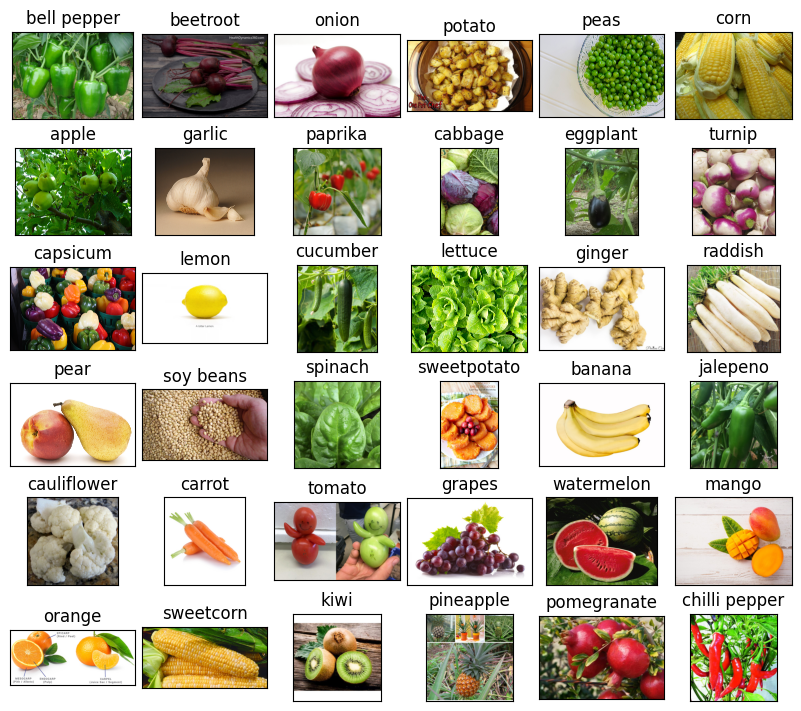

In [25]:
# Create a DataFrame with one Label of each category
df_unique = train_df.copy().drop_duplicates(subset=["Label"]).reset_index()

# Display some pictures of the dataset
fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(8, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df_unique.Filepath[i]))
    ax.set_title(df_unique.Label[i], fontsize = 12)
plt.tight_layout(pad=0.5)
plt.show()

## Create dataloader for ResNet101

In [26]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 2780 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


## Transfer learning with ResNet101

In [27]:
# Load the pretained model
pretrained_model = tf.keras.applications.resnet.ResNet101(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model.trainable = False

171446536/171446536 [==============================] - 1s 0us/step


In [28]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=5,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/5
87/87 [==============================] - 102s 1s/step - loss: 1.6181 - accuracy: 0.5788 - val_loss: 0.4542 - val_accuracy: 0.8533
Epoch 2/5
87/87 [==============================] - 74s 847ms/step - loss: 0.4993 - accuracy: 0.8399 - val_loss: 0.3460 - val_accuracy: 0.8892
Epoch 3/5
87/87 [==============================] - 74s 858ms/step - loss: 0.2871 - accuracy: 0.9040 - val_loss: 0.2766 - val_accuracy: 0.9072
Epoch 4/5
87/87 [==============================] - 77s 887ms/step - loss: 0.1830 - accuracy: 0.9417 - val_loss: 0.1694 - val_accuracy: 0.9551
Epoch 5/5
87/87 [==============================] - 75s 857ms/step - loss: 0.1236 - accuracy: 0.9622 - val_loss: 0.1829 - val_accuracy: 0.9491


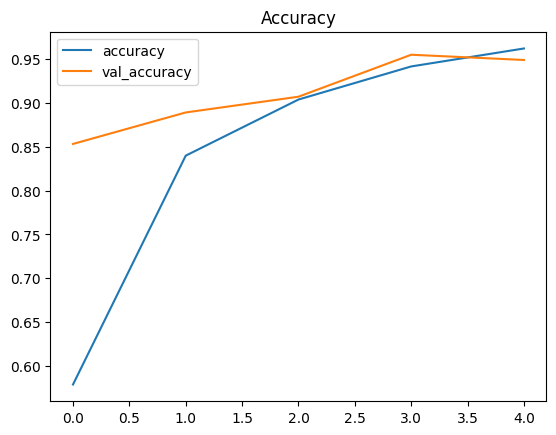

In [29]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

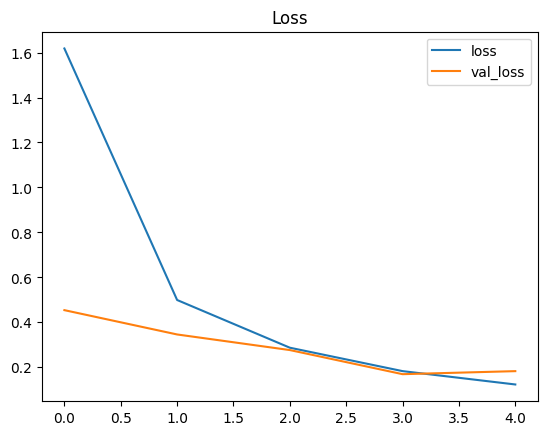

In [30]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

### Testing and Visualize the result

In [31]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

11/11 [==============================] - 12s 885ms/step


In [32]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 94.91%


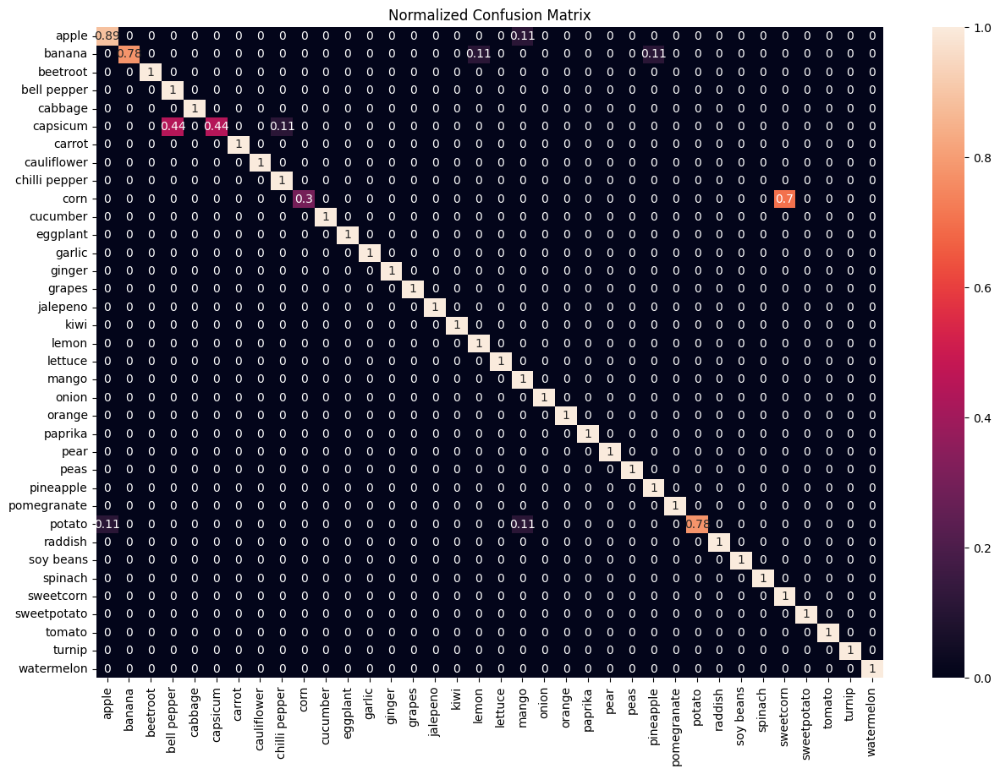

In [33]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

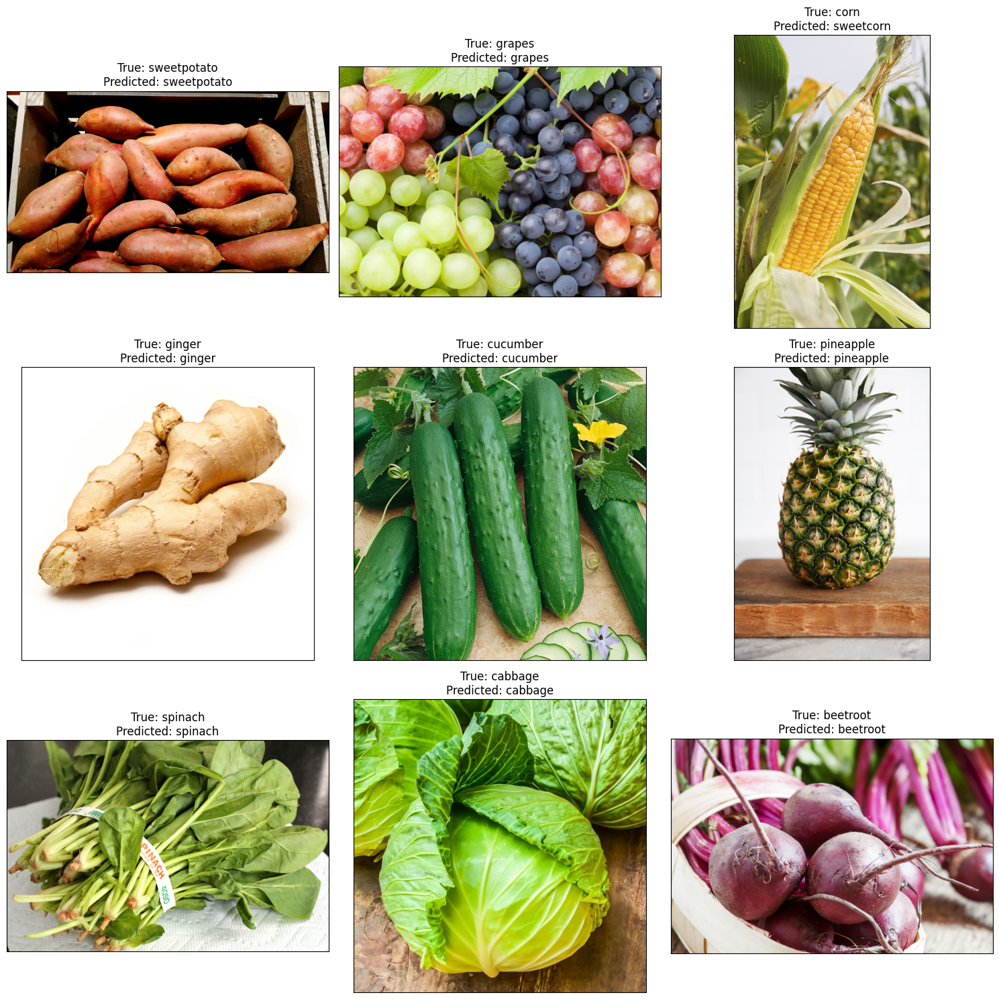

In [34]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

## Create dataloader for EfficientNetB7

In [35]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 2780 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


## Transfer learning with EficientNetB7



In [36]:
# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB7(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model.trainable = False

258076736/258076736 [==============================] - 2s 0us/step


In [37]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=5,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/5
87/87 [==============================] - 113s 1s/step - loss: 1.6033 - accuracy: 0.5860 - val_loss: 0.4426 - val_accuracy: 0.8623
Epoch 2/5
87/87 [==============================] - 83s 948ms/step - loss: 0.5971 - accuracy: 0.7939 - val_loss: 0.3496 - val_accuracy: 0.8623
Epoch 3/5
87/87 [==============================] - 80s 921ms/step - loss: 0.4223 - accuracy: 0.8554 - val_loss: 0.2296 - val_accuracy: 0.9222
Epoch 4/5
87/87 [==============================] - 79s 898ms/step - loss: 0.3162 - accuracy: 0.8813 - val_loss: 0.2118 - val_accuracy: 0.9251
Epoch 5/5
87/87 [==============================] - 79s 907ms/step - loss: 0.2439 - accuracy: 0.9061 - val_loss: 0.2114 - val_accuracy: 0.9102


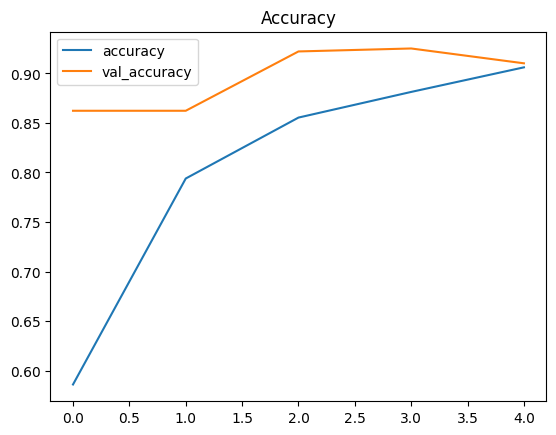

In [38]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

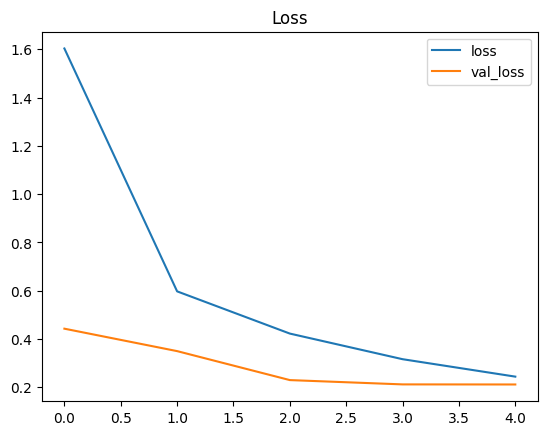

In [39]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

### Testing and Visualize the result

In [40]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

11/11 [==============================] - 15s 952ms/step


In [41]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 91.02%


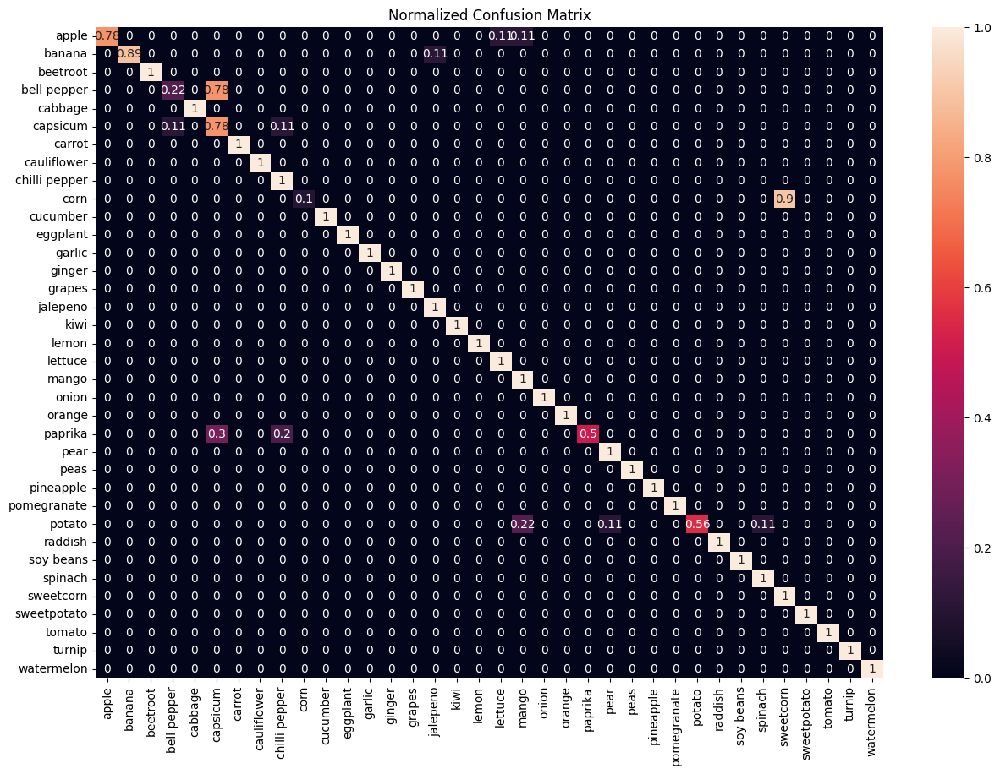

In [42]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

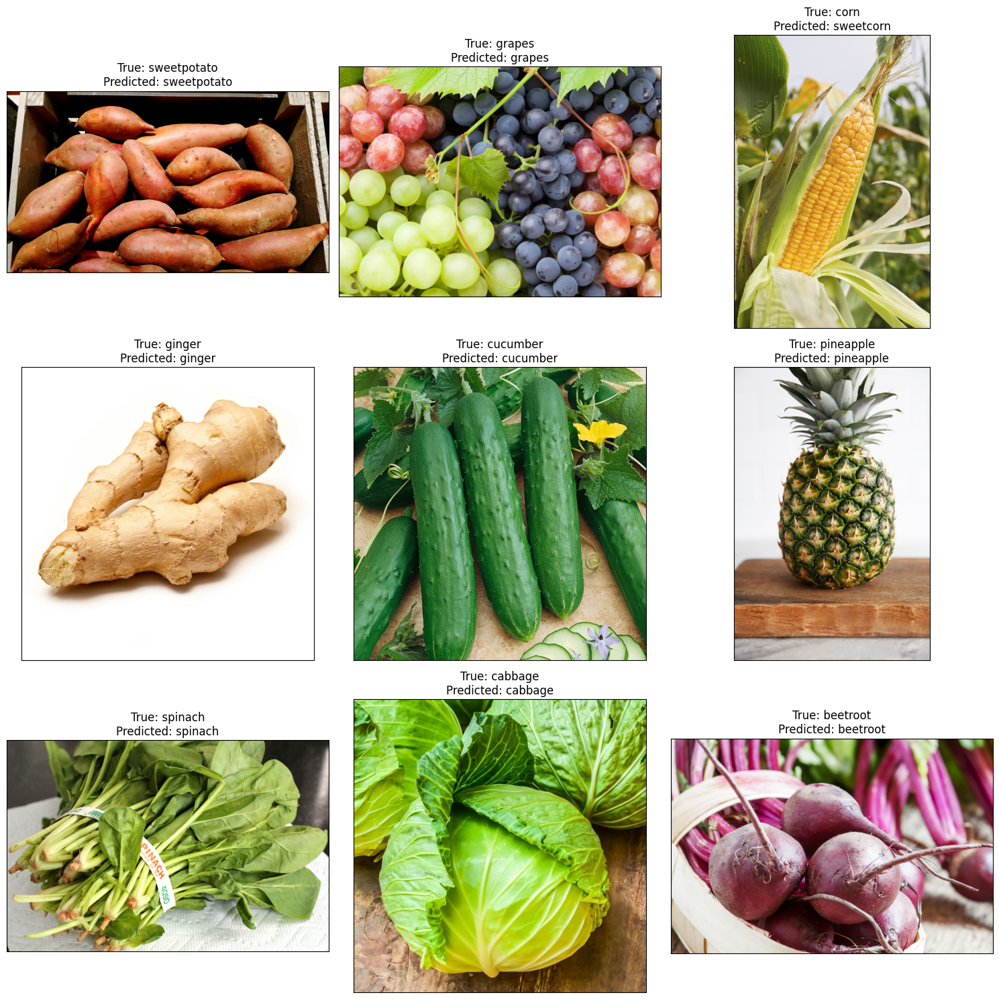

In [43]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

## Create dataloader for ConvNeXtLarge

In [44]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.convnext.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.convnext.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 2780 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


## Transfer learning with ConvNeXtLarge



In [45]:
# Load the pretained model
pretrained_model = tf.keras.applications.convnext.ConvNeXtLarge(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model.trainable = False

785596384/785596384 [==============================] - 7s 0us/step


In [46]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=5,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/5
87/87 [==============================] - 147s 1s/step - loss: 0.7009 - accuracy: 0.8183 - val_loss: 0.2549 - val_accuracy: 0.9222
Epoch 2/5
87/87 [==============================] - 108s 1s/step - loss: 0.2061 - accuracy: 0.9266 - val_loss: 0.2361 - val_accuracy: 0.9042
Epoch 3/5
87/87 [==============================] - 107s 1s/step - loss: 0.1578 - accuracy: 0.9342 - val_loss: 0.2032 - val_accuracy: 0.9251
Epoch 4/5
87/87 [==============================] - 107s 1s/step - loss: 0.1386 - accuracy: 0.9378 - val_loss: 0.2050 - val_accuracy: 0.9192
Epoch 5/5
87/87 [==============================] - 106s 1s/step - loss: 0.1284 - accuracy: 0.9363 - val_loss: 0.1606 - val_accuracy: 0.9341


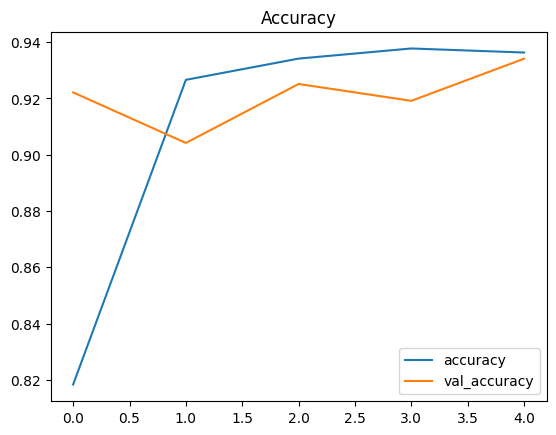

In [47]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

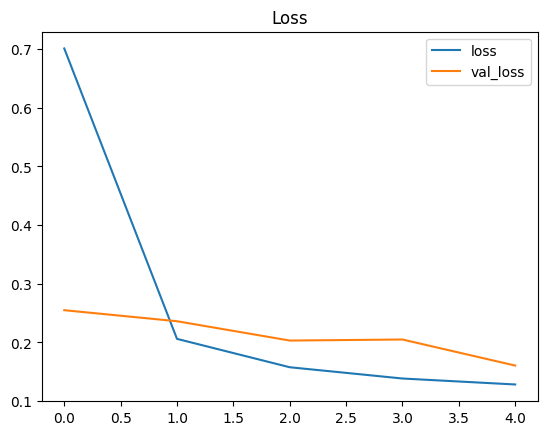

In [48]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

### Testing and Visualize the result

In [49]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

11/11 [==============================] - 16s 1s/step


In [50]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 93.41%


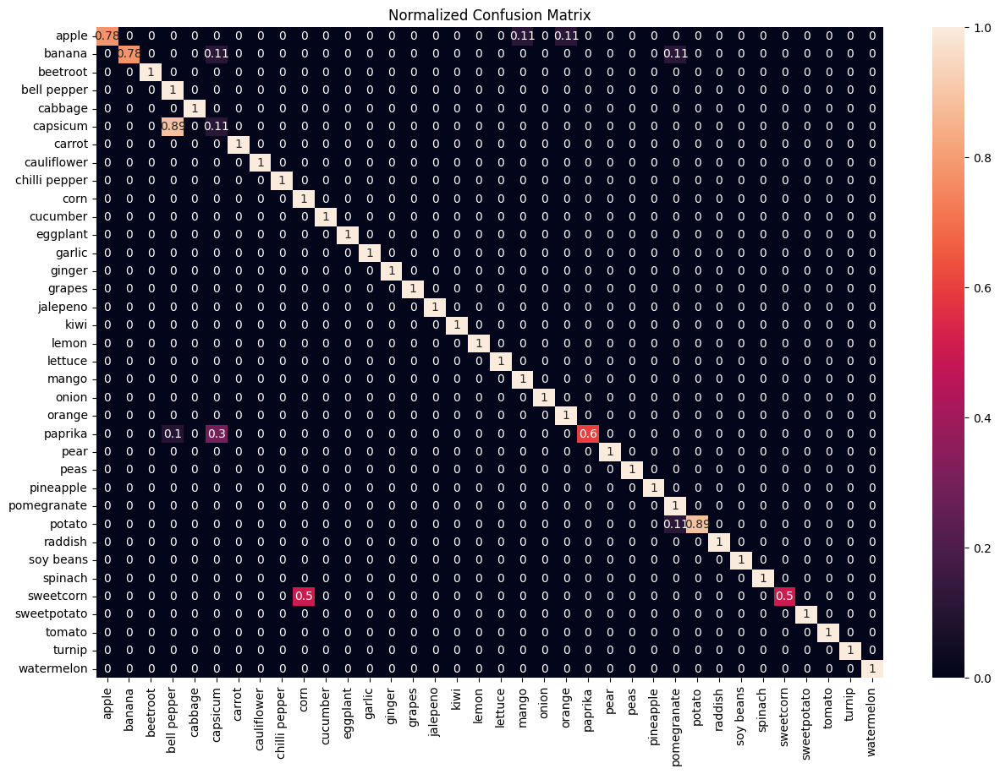

In [51]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

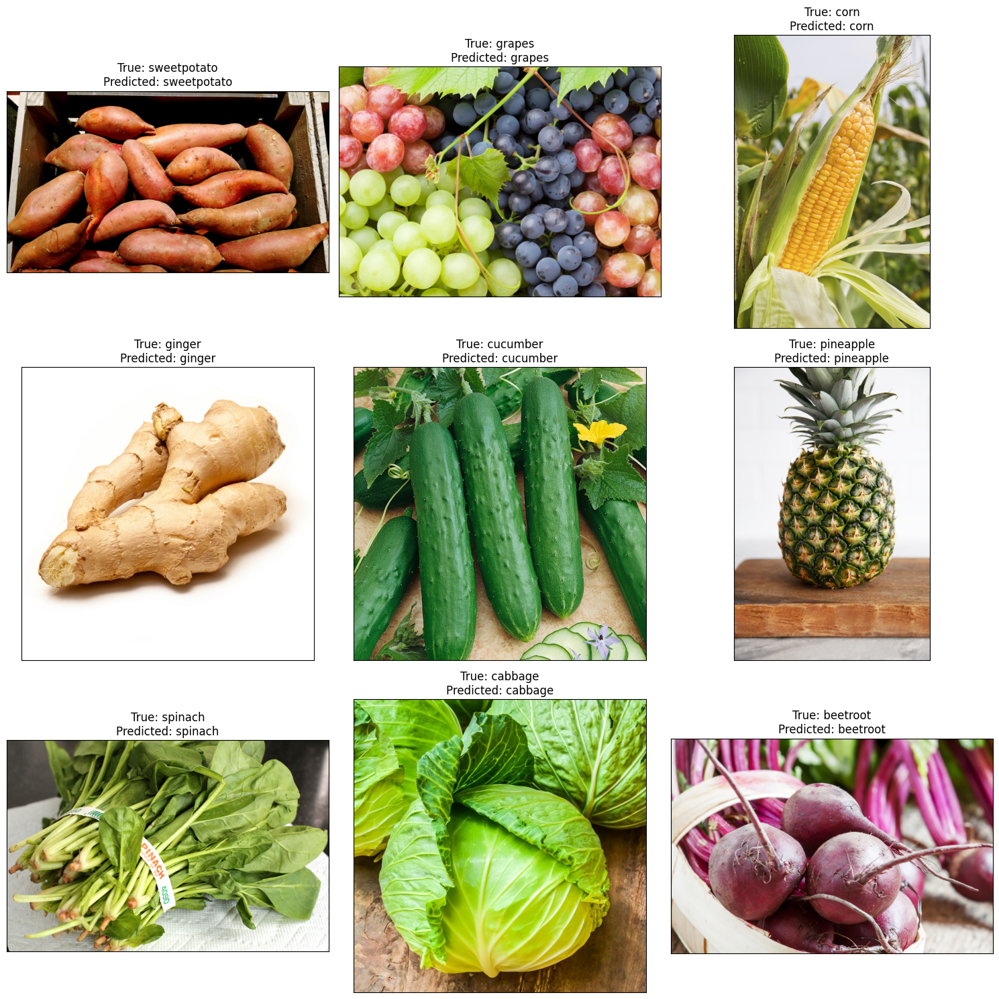

In [52]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()